### This guidebook provides a framework for analyzing JUUL employee emails using time series techniques. The goal is to understand communication patterns and communication dynamics over time.

#### Import the required libraries


In [51]:
import re
import polars as pl
import plotly.graph_objects as go
import plotly.express as px

#### Read the document metadata parquet file generated using API wrapper in JUUL_Document_Retrieval.ipynb

In [52]:
from src.util import *

csv_to_parquet('juul_documents_metadata.csv')

In [53]:
df = pl.read_parquet('juul_documents_metadata.parquet') # modify the filename as required
df.shape

(1408159, 28)

#### Step 1: Data Preparation

Modify the dataframe to keep columns of interest and filter for emails

In [54]:
df.columns

['id',
 'collection',
 'collectioncode',
 'custodian',
 'availability',
 'source',
 'datesent',
 'filename',
 'filepath',
 'topic',
 'case',
 'title',
 'author',
 'documentdate',
 'type',
 'pages',
 'recipient',
 'brand',
 'bates',
 'redacted',
 'dateaddeducsf',
 'datereceived',
 'copied',
 'redactedby',
 'attachment',
 'datemodifiedindustry',
 'cited',
 'redaction']

In [55]:
# Modify the dataframe to keep the following columns id, 'title', 'author','documentdate', 'type', 'pages', 'topic' which are of interest for the analysis.
df = df.filter(pl.col('type').str.contains('email')).select(['id', 'title', 'author','documentdate', 'type', 'pages', 'topic'])
df.shape

(1408159, 7)

Example of what the modified dataframe should look like

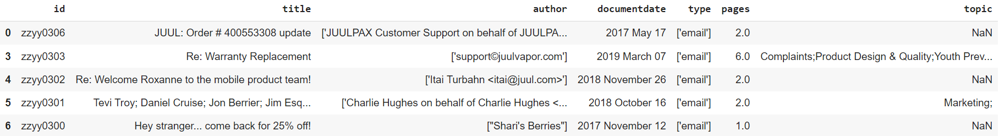

Check for null values in author, document date and topic column. Remove records with null values if required

In [56]:
df = df.drop_nulls(pl.selectors.by_name('author', 'documentdate', 'topic'))
df.shape

(300476, 7)

In [57]:
df.select(pl.col("topic"))

topic
str
"""Health & Safety;"""
"""Complaints;Product Design & Qu…"
"""Marketing;"""
"""Marketing;"""
"""Government & Public Affairs"""
…
"""Youth Prevention;"""
"""Complaints;"""
"""Corporate Development;"""


Assign the broad topic for each email record

In [58]:
df = df.with_columns(pl.col("topic").str.split(';').list.get(0).alias("assigned_topic"))
df.shape

(300476, 8)

In [59]:
set(*df.select("assigned_topic").to_dict().values())

{'Brand Protection',
 'Complaints',
 'Corporate Development',
 'Flavors',
 'Government & Public Affairs',
 'Health & Safety',
 'Marketing',
 'Marketing\\Online Advertising',
 'Product Design & Quality',
 'Youth Prevention',
 'jli1\\eview\\MASS_AG_INV\\RR_JLI_ALL_PROD_DB\\DATA1035259\\LOAD_0008\\JLI20210426_01_Downgrade\\JLI20210426_01_Downgrade\\TEXT\\0005\\JLI42850733.txt',
 'jli1\\eview\\MASS_AG_INV\\RR_JLI_ALL_PROD_DB\\DATA1035259\\LOAD_0008\\JLI20210426_01_Downgrade\\JLI20210426_01_Downgrade\\TEXT\\0010\\JLI42881054.txt'}

Convert the date to correct datetime format

In [60]:
df = df.with_columns(pl.col('documentdate').str.to_date(format='%Y %B %d')) # example documentdate: 2020 May 03
df.dtypes

[String, String, String, Date, String, Int64, String, String]

In [61]:
df

id,title,author,documentdate,type,pages,topic,assigned_topic
str,str,str,date,str,i64,str,str
"""zzyy0316""","""RE: JUUL FILLING CM 0% ROSE 5J…","""['Dan Gresham <dgresham@beckwa…",2018-06-11,"""['email']""",3,"""Health & Safety;""","""Health & Safety"""
"""zzyy0303""","""Re: Warranty Replacement""","""['support©juulvapor.com']""",2019-03-07,"""['email']""",6,"""Complaints;Product Design & Qu…","""Complaints"""
"""zzyy0301""","""Tevi Troy; Daniel Cruise; Jon …","""['Charlie Hughes on behalf of …",2018-10-16,"""['email']""",2,"""Marketing;""","""Marketing"""
"""zzyy0299""","""Re: JUUL Prototype (2.0)""","""['Nicole Rodzen <nicole@ploom.…",2015-01-05,"""['email']""",8,"""Marketing;""","""Marketing"""
"""zzyy0296""","""Re: SRNT-E - JUUL deemed ""a to…","""['Josh Vose <jvose@juul.com>']""",2019-05-06,"""['email']""",2,"""Government & Public Affairs""","""Government & Public Affairs"""
…,…,…,…,…,…,…,…
"""ffbb0302""","""Fwd: Generation Citizen Youth …","""['Ashley Gould']""",2018-05-11,"""['email']""",2,"""Youth Prevention;""","""Youth Prevention"""
"""ffbb0301""","""Re: JUUL I Support""","""['on behalf of']""",2018-07-24,"""['email']""",2,"""Complaints;""","""Complaints"""
"""ffbb0300""","""RE: Q4 Investor Update - v3""","""['Tim Danaher <tim@juul.com>']""",2018-02-14,"""['email']""",1,"""Corporate Development;""","""Corporate Development"""


In [62]:
df = df.with_columns(
    pl.col("author").str.split(",")
)

In [63]:
# Filter the DataFrame to include only rows with 'juul', 'pax', or 'ploom' in the author column
l = ['juul', 'pax', 'ploom', 'juullabs']
filtered_df = df.filter(pl.col('author').list.eval(pl.element().str.contains_any(l)).list.any() &
    ~pl.col('assigned_topic').str.contains(r'\\')  # Exclude topics with file paths
)
filtered_df.shape

(166990, 8)

The filtered_df should look like this
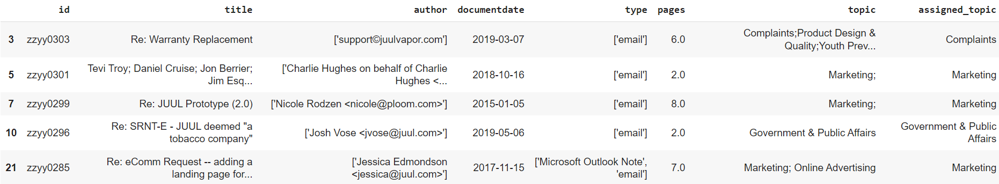

In [64]:
filtered_df.head()

id,title,author,documentdate,type,pages,topic,assigned_topic
str,str,list[str],date,str,i64,str,str
"""zzyy0303""","""Re: Warranty Replacement""","[""['support©juulvapor.com']""]",2019-03-07,"""['email']""",6,"""Complaints;Product Design & Qu…","""Complaints"""
"""zzyy0301""","""Tevi Troy; Daniel Cruise; Jon …","[""['Charlie Hughes on behalf of Charlie Hughes <chughes©juul.com>']""]",2018-10-16,"""['email']""",2,"""Marketing;""","""Marketing"""
"""zzyy0299""","""Re: JUUL Prototype (2.0)""","[""['Nicole Rodzen <nicole@ploom.com>']""]",2015-01-05,"""['email']""",8,"""Marketing;""","""Marketing"""
"""zzyy0296""","""Re: SRNT-E - JUUL deemed ""a to…","[""['Josh Vose <jvose@juul.com>']""]",2019-05-06,"""['email']""",2,"""Government & Public Affairs""","""Government & Public Affairs"""
"""zzyy0285""","""Re: eComm Request -- adding a …","[""['Jessica Edmondson <jessica@juul.com>']""]",2017-11-15,"""['email']""",7,"""Marketing; Online Advertising""","""Marketing"""


#### Time series analysis



Visualize the graph for change in email volume and broad topics across the years

In [65]:
import itertools
# Group by year and overall topic, visualize the graph - email records
filtered_df = filtered_df.with_columns(pl.col("documentdate").dt.year().alias("year"), pl.col("documentdate").dt.month().alias("month"))
yearly_topic_counts = filtered_df.group_by(['year', 'assigned_topic']).len(name='document_count').sort('year')
years = filtered_df['year'].unique()
assigned_topics = filtered_df['assigned_topic'].unique()
combinations = list(itertools.product(years, assigned_topics))

l = []
for year, assigned_topic in combinations:
    l.append({"year": year, "assigned_topic": assigned_topic})
temp = pl.DataFrame(l, schema_overrides={"year": pl.Int32})
cross = temp.join(yearly_topic_counts, on=["year","assigned_topic"], how="left")
yearly_topic_counts = cross.fill_null(0)
print(yearly_topic_counts)

shape: (90, 3)
┌──────┬─────────────────────────────┬────────────────┐
│ year ┆ assigned_topic              ┆ document_count │
│ ---  ┆ ---                         ┆ ---            │
│ i32  ┆ str                         ┆ u32            │
╞══════╪═════════════════════════════╪════════════════╡
│ 2009 ┆ Marketing                   ┆ 0              │
│ 2009 ┆ Youth Prevention            ┆ 0              │
│ 2009 ┆ Government & Public Affairs ┆ 0              │
│ 2009 ┆ Product Design & Quality    ┆ 0              │
│ 2009 ┆ Complaints                  ┆ 0              │
│ …    ┆ …                           ┆ …              │
│ 2019 ┆ Complaints                  ┆ 2374           │
│ 2019 ┆ Flavors                     ┆ 1452           │
│ 2019 ┆ Corporate Development       ┆ 4497           │
│ 2019 ┆ Health & Safety             ┆ 2780           │
│ 2019 ┆ Brand Protection            ┆ 3461           │
└──────┴─────────────────────────────┴────────────────┘


In [67]:
fig = go.Figure()

# Add a trace for each topic
for topic in yearly_topic_counts['assigned_topic'].unique():
    topic_data = yearly_topic_counts.filter(pl.col('assigned_topic') == topic)
    fig.add_trace(go.Scatter(x=topic_data['year'].cast(str), y=topic_data['document_count'],
                             mode='lines', name=topic))

# Layout - titles
fig.update_layout(
    title='Email Counts by Year and Broad Topic',
    xaxis_title='Year',
    yaxis_title='Number of Documents',
    legend_title='Broad Topic')

fig.show()

Visualize the number of email records by year, overall topic, and detailed topic, with an interactive dropdown for filtering.

C:\Users\rolando\AppData\Local\Temp\ipykernel_22856\3167453220.py:8: DeprecationWarning:

`pl.count()` is deprecated. Please use `pl.len()` instead.

C:\Users\rolando\AppData\Local\Temp\ipykernel_22856\3167453220.py:36: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



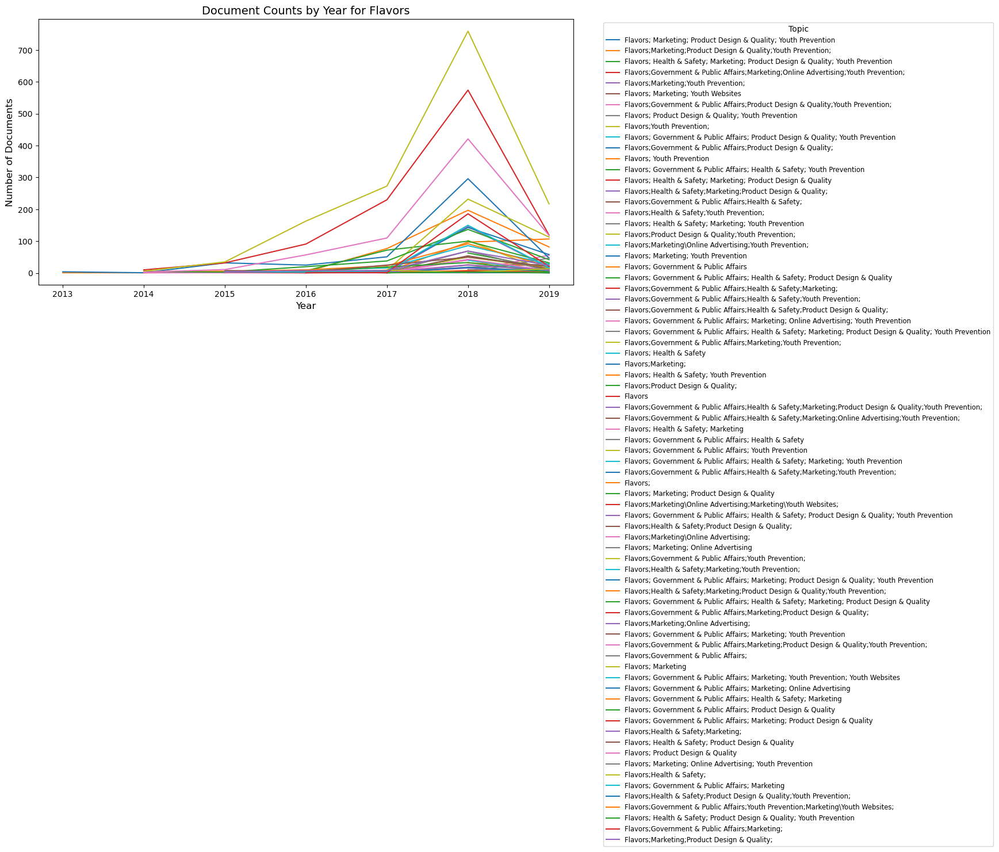

In [68]:
# Non-interactive graph
import matplotlib.pyplot as plt

# Group by year, assigned_topic, and topic, then count the documents
yearly_topic_counts = (
    filtered_df
    .group_by(['year', 'assigned_topic', 'topic'])
    .agg(pl.count().alias('document_count'))
    .sort('year')
)

# Specify the overall topic to visualize
chosen_assigned_topic = "Flavors"  # Replace with the desired overall topic

# Filter data for the chosen assigned topic
if chosen_assigned_topic in yearly_topic_counts['assigned_topic'].unique():
    topic_data = yearly_topic_counts.filter(pl.col('assigned_topic') == chosen_assigned_topic)
    
    # Create a new figure
    plt.figure(figsize=(12, 6))
    
    # Plot each topic for the chosen assigned topic
    for topic in topic_data['topic'].unique():
        sub_topic_data = topic_data.filter(pl.col('topic') == topic)
        x = sub_topic_data['year'].to_list()
        y = sub_topic_data['document_count'].to_list()
        plt.plot(x, y, label=topic)
    
    # Layout - titles, labels, and legend
    plt.title(f'Document Counts by Year for {chosen_assigned_topic}', fontsize=14)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel('Number of Documents', fontsize=12)
    plt.legend(title='Topic', loc='upper left', bbox_to_anchor=(1.05, 1), fontsize='small')
    
    # Adjust layout
    plt.tight_layout()
    
    # Show the plot
    plt.show()


In [69]:
# Group by year, assigned_topic, and topic, then count the documents
yearly_topic_counts = filtered_df.group_by(['year', 'assigned_topic', 'topic']).len(name='document_count').sort('year')

# Create the figure
fig = go.Figure()

# Add a trace for each unique topic
for topic in yearly_topic_counts['topic'].unique():
    topic_data = yearly_topic_counts.filter(pl.col('topic').eq(topic))
    fig.add_trace(go.Scatter(x=topic_data['year'], y=topic_data['document_count'],
                             mode='lines', name=topic))

# Get unique assigned topics for the dropdown filter
assigned_topics = yearly_topic_counts['assigned_topic'].unique()

# Create dropdown buttons
dropdown_buttons = [{'label': 'All Topics', 'method': 'update', 'args': [{'visible': [True] * len(fig.data)}, {'title': 'Document Counts by Year and Topic'}]}]

for assigned_topic in assigned_topics:
    visibility = [(trace.name in yearly_topic_counts.filter(pl.col('assigned_topic').eq(assigned_topic))['topic']) for trace in fig.data]
    dropdown_buttons.append({
        'label': assigned_topic,
        'method': 'update',
        'args': [{'visible': visibility},
                 {'title': f'Document Counts by Year for {assigned_topic}'}]})

# Layout - titles and dropdown
fig.update_layout(
    title='Email Counts by Year and Topic',
    xaxis_title='Year',
    yaxis_title='Number of Documents',
    legend_title='Topic',
    updatemenus=[{'buttons': dropdown_buttons,
                  'direction': 'down',
                  'showactive': True,}])

# Show the plot
fig.show()


Visualize the graph for change in email volume for broad topics across month and year for more granular analysis

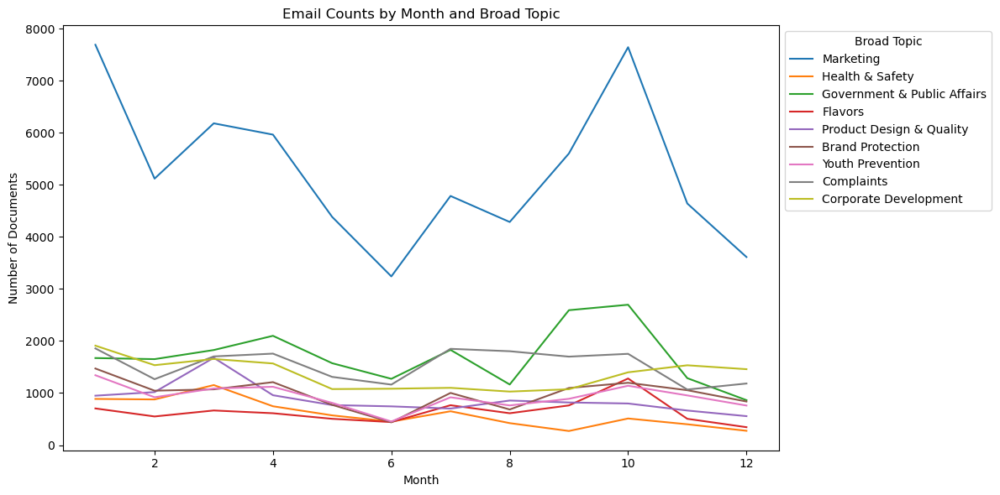

In [70]:
# Non-interactive visualization
import matplotlib.pyplot as plt

# Group by month and overall topic, visualize the graph - email records
monthly_topic_counts = filtered_df.group_by(['month', 'assigned_topic']).len(name='document_count').sort('month')

assigned_topics = monthly_topic_counts['assigned_topic'].unique()

plt.figure(figsize=(12, 6))

# Add a line for each topic
for topic in assigned_topics:
    topic_data = monthly_topic_counts.filter(pl.col('assigned_topic') == topic)
    x = topic_data['month'].to_list()
    y = topic_data['document_count'].to_list()
    plt.plot(x, y, label=topic)

# Add titles and labels
plt.title('Email Counts by Month and Broad Topic')
plt.xlabel('Month')
plt.ylabel('Number of Documents')
plt.legend(title='Broad Topic', loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()

# Show the plot
plt.show() 


In [71]:


# Group by month and overall topic, visualize the graph - email records
monthly_topic_counts = filtered_df.group_by(['month', 'assigned_topic']).len(name='document_count').sort('month')

fig = go.Figure()

# Add a trace for each topic
for topic in monthly_topic_counts['assigned_topic'].unique():
    topic_data = monthly_topic_counts.filter(pl.col('assigned_topic').eq(topic))
    fig.add_trace(go.Scatter(x=topic_data['month'], y=topic_data['document_count'],
                             mode='lines', name=topic))

# Layout - titles
fig.update_layout(
    title='Email Counts by Month and Broad Topic',
    xaxis_title='Month',
    yaxis_title='Number of Documents',
    legend_title='Broad Topic')

fig.show()

Visualize the number of email records by month, overall topic, and detailed topic, with an interactive dropdown for filtering.

C:\Users\rolando\AppData\Local\Temp\ipykernel_22856\538431109.py:8: DeprecationWarning:

`pl.count()` is deprecated. Please use `pl.len()` instead.

C:\Users\rolando\AppData\Local\Temp\ipykernel_22856\538431109.py:41: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



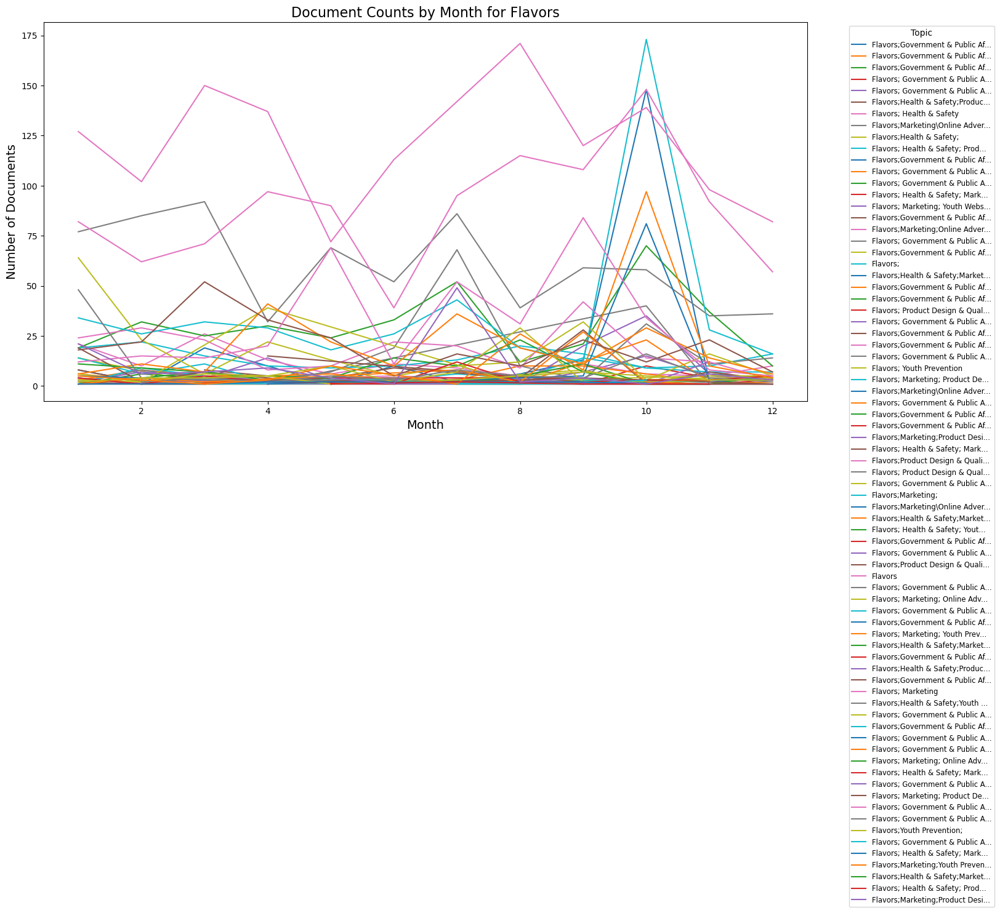

In [72]:
# non-interactive version of graph
import matplotlib.pyplot as plt

# Group by month, assigned_topic, and topic, then count the documents
monthly_topic_counts = (
    filtered_df
    .group_by(['month', 'assigned_topic', 'topic'])
    .agg(pl.count().alias('document_count'))
    .sort('month')
)

# Specify the overall topic to visualize
chosen_assigned_topic = "Flavors"  # Replace with the desired overall topic

# Check if the chosen assigned topic exists
if chosen_assigned_topic in monthly_topic_counts['assigned_topic'].unique():
    # Filter data for the chosen assigned topic
    topic_data = monthly_topic_counts.filter(pl.col('assigned_topic') == chosen_assigned_topic)
    
    # Create a new figure
    plt.figure(figsize=(16, 8))
    
    # Plot each topic for the chosen assigned topic
    for topic in topic_data['topic'].unique():
        sub_topic_data = topic_data.filter(pl.col('topic') == topic)
        x = sub_topic_data['month'].to_list()
        y = sub_topic_data['document_count'].to_list()
        
        plt.plot(x, y, label=topic[:30] + ("..." if len(topic) > 30 else ""))  # Truncate if too long
    
    # Layout - titles, labels, and legend
    plt.title(f'Document Counts by Month for {chosen_assigned_topic}', fontsize=16)
    plt.xlabel('Month', fontsize=14)
    plt.ylabel('Number of Documents', fontsize=14)
    
    # Move the legend outside the plot and set a smaller font size
    plt.legend(title='Topic', loc='upper left', bbox_to_anchor=(1.05, 1), fontsize='small')
    
    plt.tight_layout()
    plt.show()

In [73]:
monthly_topic_counts = filtered_df.group_by(['month', 'assigned_topic', 'topic']).len(name='document_count').sort('month')

fig = go.Figure()

# Add a trace for each detailed topic
for topic in monthly_topic_counts['topic'].unique():
    topic_data = monthly_topic_counts.filter(pl.col('topic').eq(topic))
    fig.add_trace(go.Scatter(x=topic_data['month'], y=topic_data['document_count'],
                             mode='lines', name=topic))

# Get unique assigned topics for the dropdown filter
assigned_topics = monthly_topic_counts['assigned_topic'].unique()

# Create dropdown buttons
dropdown_buttons = [{'label': 'All Topics', 'method': 'update', 'args': [{'visible': [True] * len(fig.data)}, {'title': 'Document Counts by Month and Topic'}]}]

for assigned_topic in assigned_topics:
    visibility = [(trace.name in monthly_topic_counts.filter(pl.col('assigned_topic').eq(assigned_topic))['topic']) for trace in fig.data]
    dropdown_buttons.append({
        'label': assigned_topic,
        'method': 'update',
        'args': [{'visible': visibility},
                 {'title': f'Email Counts by Month for {assigned_topic}'}]})

# Layout - titles and dropdown
fig.update_layout(
    title='Email Counts by Month and Topic',
    xaxis_title='Month',
    yaxis_title='Number of Documents',
    legend_title='Topic',
    updatemenus=[{'buttons': dropdown_buttons,
                  'direction': 'down',
                  'showactive': True,}])

# Show the plot
fig.show()


### Time series analysis by author

Extract email ids of employees

In [74]:

email_regexp = re.compile(r'\b[A-Za-z0-9._%+-]+@[A-Za-z0-9.-]+\.[A-Z|a-z]{2,}\b')
def extract_email(email_list):
    res = email_regexp.findall(email_list[0])
    return res[0] if res else None
filtered_df = filtered_df.with_columns(pl.col('author').map_elements(extract_email, return_dtype=str).alias('author_email'))

In [75]:
# run to check whether the name and email id have been extracted correctly
filtered_df.select('author', 'author_email')

author,author_email
list[str],str
"[""['support©juulvapor.com']""]",null
"[""['Charlie Hughes on behalf of Charlie Hughes <chughes©juul.com>']""]",null
"[""['Nicole Rodzen <nicole@ploom.com>']""]","""nicole@ploom.com"""
"[""['Josh Vose <jvose@juul.com>']""]","""jvose@juul.com"""
"[""['Jessica Edmondson <jessica@juul.com>']""]","""jessica@juul.com"""
…,…
"[""['Elizabeth Jay <elizabeth@juul.com>']""]","""elizabeth@juul.com"""
"[""['Nora Walker <nora@juul.com>']""]","""nora@juul.com"""
"[""[""'Ben' via JUUL Support on behalf of 'Ben' via JUUL Support <support@juulvapor.com>""]""]","""support@juulvapor.com"""


In [76]:
# run to check number of unique authors to select the top X number of authors to visualize
unique_author_emails = filtered_df['author_email'].unique()
print(f"Number of unique author emails: {len(unique_author_emails)}")


Number of unique author emails: 2065


In [77]:
filtered_df.columns

['id',
 'title',
 'author',
 'documentdate',
 'type',
 'pages',
 'topic',
 'assigned_topic',
 'year',
 'month',
 'author_email']

Visualize email records by year and author for top X number

C:\Users\rolando\AppData\Local\Temp\ipykernel_22856\2492653151.py:8: DeprecationWarning:

`pl.count()` is deprecated. Please use `pl.len()` instead.



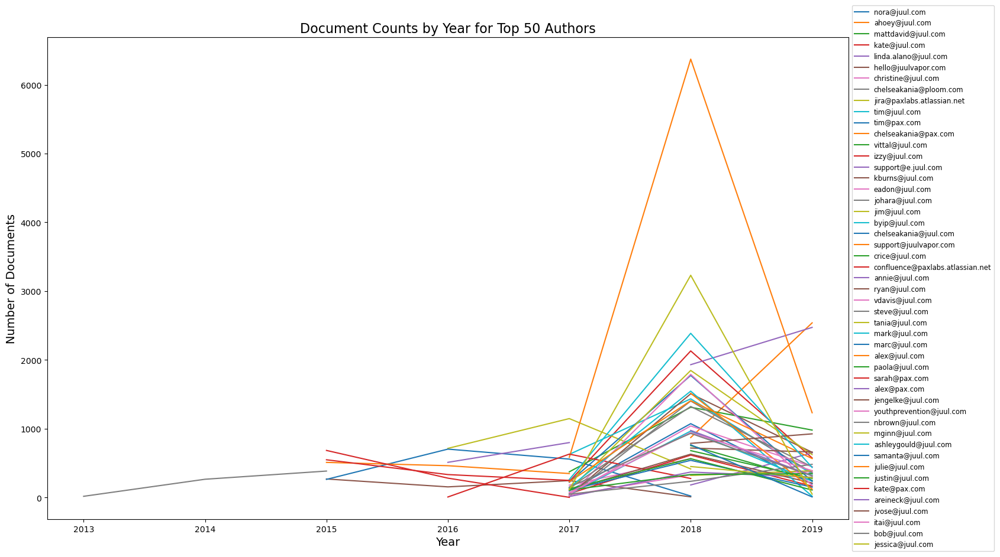

In [78]:
# non-interactive plot
import matplotlib.pyplot as plt

# Group by year and author
author_total_counts = (
    filtered_df
    .group_by('author_email')
    .agg(pl.count().alias('total_count'))
    .sort('total_count', descending=True)
)

# Get the top 50 authors (we have shown 50, but modify as required)
top_50_authors = author_total_counts.head(50)['author_email']

# Filter for top authors
filtered_email_pdf = filtered_df.filter(pl.col('author_email').is_in(top_50_authors))

# Group by year and author
yearly_topic_counts = (
    filtered_email_pdf
    .group_by(['year', 'author_email'])
    .agg(pl.len().alias('document_count'))
    .sort('year')
)

# Create the plot
plt.figure(figsize=(20, 10))

# Add a line for each author
for author in yearly_topic_counts['author_email'].unique():
    author_data = yearly_topic_counts.filter(pl.col('author_email') == author)
    plt.plot(
        author_data['year'].to_list(),
        author_data['document_count'].to_list(),
        label=author
    )

# Add title, labels, and legend
plt.title('Document Counts by Year for Top 50 Authors', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Documents', fontsize=14)
plt.legend(
    loc='center left', 
    bbox_to_anchor=(1, 0.5),  # Place legend outside the plot
    fontsize='small'
)

# Adjust layout to fit the legend
plt.tight_layout(rect=[0, 0, 0.85, 1])

# Show the plot
plt.show()


In [79]:
# Group by year and author, visualize the graph - email records
author_total_counts = filtered_df.group_by('author_email').len(name='total_count').sort('total_count', descending=True)
top_150_authors = author_total_counts.head(150)['author_email'] # modify as required
filtered_email_pdf = filtered_df.filter(pl.col('author_email').is_in(top_150_authors)) # modify as required
yearly_topic_counts = filtered_email_pdf.group_by(['year', 'author_email']).len(name='document_count').sort('year')

fig = go.Figure()

# Add a trace for each author
for author in yearly_topic_counts['author_email'].unique():
    author_data = yearly_topic_counts.filter(pl.col('author_email').eq(author))
    fig.add_trace(go.Scatter(x=author_data['year'], y=author_data['document_count'],
                             mode='lines', name=author, visible='legendonly'))

# Add dropdown filter
dropdown_buttons = [
    {'label': 'All Authors', 'method': 'update', 'args': [{'visible': [True]*len(fig.data)}, {'title': 'Document Counts by Year and Top 150 Authors'}]}]

for i, author in enumerate(yearly_topic_counts['author_email'].unique()):
    visible = [False]*len(fig.data)
    visible[i] = True
    dropdown_buttons.append({'label': author, 'method': 'update', 'args': [{'visible': visible}, {'title': f'Document Counts by Year for {author}'}]})

fig.update_layout(
    updatemenus=[{
        'buttons': dropdown_buttons,
        'direction': 'down',
        'showactive': True
    }],
    title='Email Counts by Year and Top 150 Authors',
    xaxis_title='Year',
    yaxis_title='Number of Documents',
    legend_title='Author')

fig.show()

Visualize email records by year, topic and author for all authors

In [80]:
author_data

year,author_email,document_count
i32,str,u32
2018,"""tableau.reporting@juul.com""",45
2019,"""tableau.reporting@juul.com""",235


C:\Users\rolando\AppData\Local\Temp\ipykernel_22856\695978515.py:10: DeprecationWarning:

`pl.count()` is deprecated. Please use `pl.len()` instead.



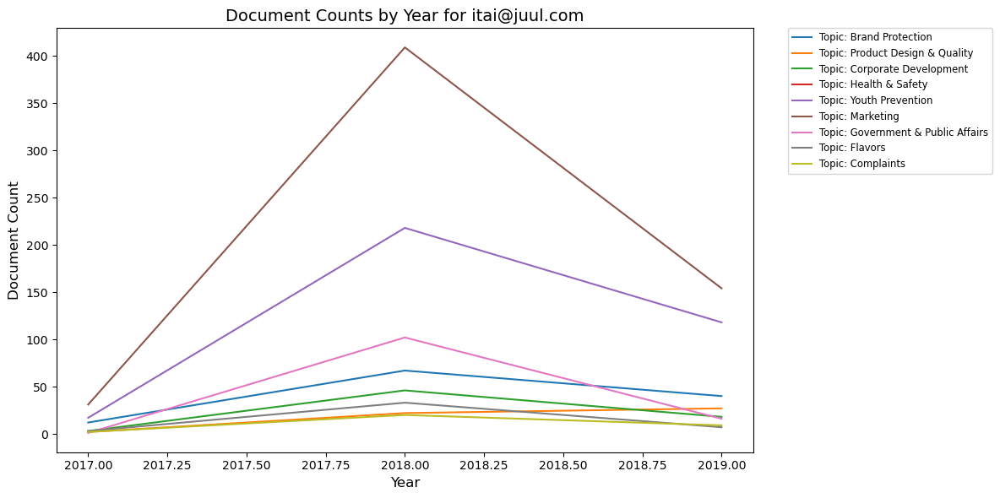

In [81]:
# non-interactive plot

import matplotlib.pyplot as plt
import math

# Group data by year, author, and topic
yearly_topic_counts = (
    filtered_email_pdf
    .group_by(['year', 'author_email', 'assigned_topic'])
    .agg(pl.count().alias('document_count'))
    .sort('year')
)

# Choose the specific author to visualize
chosen_author = yearly_topic_counts['author_email'].unique()[0]  # Replace with a specific author's email if needed

# Filter data for the chosen author
chosen_author_data = yearly_topic_counts.filter(pl.col('author_email') == chosen_author)

plt.figure(figsize=(12, 6))

# Add a line for each topic of the chosen author
for topic in chosen_author_data['assigned_topic'].unique():
    topic_data = chosen_author_data.filter(pl.col('assigned_topic') == topic)
    plt.plot(
        topic_data['year'].to_list(), 
        topic_data['document_count'].to_list(), 
        label=f'Topic: {topic}'
    )

# Set title and labels
plt.title(f'Document Counts by Year for {chosen_author}', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Document Count', fontsize=12)

# Move the legend to the side
plt.legend(
    fontsize='small', 
    loc='upper left', 
    bbox_to_anchor=(1.05, 1),  # Position legend outside the plot
    borderaxespad=0
)

plt.tight_layout()
plt.show()

In [82]:
# Group by year, author, and topic
yearly_topic_counts = filtered_email_pdf.group_by(['year', 'author_email', 'assigned_topic']).len(name='document_count').sort('year')

fig = go.Figure()

# Add traces for each author and topic
for author in yearly_topic_counts['author_email'].unique():
    author_data = yearly_topic_counts.filter(pl.col('author_email').eq(author))
    for topic in author_data['assigned_topic'].unique():
        topic_data = author_data.filter(pl.col('assigned_topic').eq(topic))
        fig.add_trace(go.Scatter(x=topic_data['year'], y=topic_data['document_count'],
                                 mode='lines', name=f'{author} - {topic}', visible=False))

# Make the first author's traces visible by default
initial_author = yearly_topic_counts['author_email'].unique()[0]
for i, trace in enumerate(fig.data):
    if initial_author in trace.name:
        fig.data[i].visible = True

# Create dropdown menu
dropdown_buttons = []
for author in yearly_topic_counts['author_email'].unique():
    visible = [author in trace.name for trace in fig.data]
    button = dict(label=author,
                  method="update",
                  args=[{"visible": visible},
                        {"title": f"Document Counts by Year for {author}"}])
    dropdown_buttons.append(button)

# Update layout with dropdown
fig.update_layout(
    title=f'Document Counts by Year for {initial_author}',
    xaxis_title='Year',
    yaxis_title='Number of Documents',
    legend_title='Topic',
    updatemenus=[{
        "buttons": dropdown_buttons,
        "direction": "down",
        "showactive": True,}])

fig.show()